In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 915.2/915.2 kB 25.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [3]:
from ultralytics import YOLO
import numpy as np
import pandas as pd

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [14]:
model_path = "/content/drive/MyDrive/Mobile Robotics Project/models/yolo11n.pt"
dataset_path = "/content/drive/MyDrive/Mobile Robotics Project/data/dataset"

In [5]:
import torch
print(torch.cuda.is_available())  # True if GPU is available

True


In [17]:
yolo = YOLO(model_path)
yolo.train(data=f'{dataset_path}/data.yaml', epochs=5, device='cuda')
valid_results = yolo.val()
print(valid_results)

Ultralytics 8.3.76 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Mobile Robotics Project/models/yolo11n.pt, data=/content/drive/MyDrive/Mobile Robotics Project/data/dataset/data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=Fals

train: Scanning /content/drive/MyDrive/Mobile Robotics Project/data/dataset/train/labels.cache... 2661 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2661/2661 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Mobile Robotics Project/data/dataset/val/labels... 524 images, 0 backgrounds, 0 corrupt: 100%|██████████| 524/524 [01:32<00:00,  5.66it/s]


val: New cache created: /content/drive/MyDrive/Mobile Robotics Project/data/dataset/val/labels.cache
Plotting labels to runs/detect/train9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train9
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      3.95G      2.175       2.41      1.522        272        640: 100%|██████████| 167/167 [02:09<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:18<00:00,  1.09s/it]


                   all        524      18647      0.647      0.491      0.529      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      4.15G      1.523      1.376      1.108        191        640: 100%|██████████| 167/167 [02:06<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:16<00:00,  1.00it/s]


                   all        524      18647      0.724      0.687      0.714      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      3.93G      1.387       1.22      1.048        376        640: 100%|██████████| 167/167 [02:06<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]


                   all        524      18647      0.753      0.708      0.769      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      4.27G      1.257      1.062     0.9966        230        640: 100%|██████████| 167/167 [02:03<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:16<00:00,  1.02it/s]


                   all        524      18647      0.819      0.753      0.793      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      3.79G      1.159      0.964     0.9615        206        640: 100%|██████████| 167/167 [02:04<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]


                   all        524      18647      0.839      0.768      0.818      0.568

5 epochs completed in 0.204 hours.
Optimizer stripped from runs/detect/train9/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train9/weights/best.pt, 5.5MB

Validating runs/detect/train9/weights/best.pt...
Ultralytics 8.3.76 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:24<00:00,  1.43s/it]


                   all        524      18647      0.839      0.768      0.818      0.568
                  free        139       5314      0.815      0.627      0.741      0.532
                  busy        385      13333      0.864      0.909      0.896      0.605
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/detect/train9
Ultralytics 8.3.76 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/drive/MyDrive/Mobile Robotics Project/data/dataset/val/labels.cache... 524 images, 0 backgrounds, 0 corrupt: 100%|██████████| 524/524 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:27<00:00,  1.22it/s]


                   all        524      18647      0.839      0.768      0.819      0.568
                  free        139       5314      0.814      0.626      0.741      0.532
                  busy        385      13333      0.864      0.909      0.896      0.605
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/train92
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d83da6a9710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,   

In [19]:
import shutil

# Define source and destination paths
source_path = "/content/yolo11n.pt"  # Update if different
dest_path = "/content/drive/MyDrive/Mobile Robotics Project/models/best2_18.pt"

# Move the trained model to Google Drive
shutil.move(source_path, dest_path)

print("Model saved to Google Drive successfully!")

Model saved to Google Drive successfully!


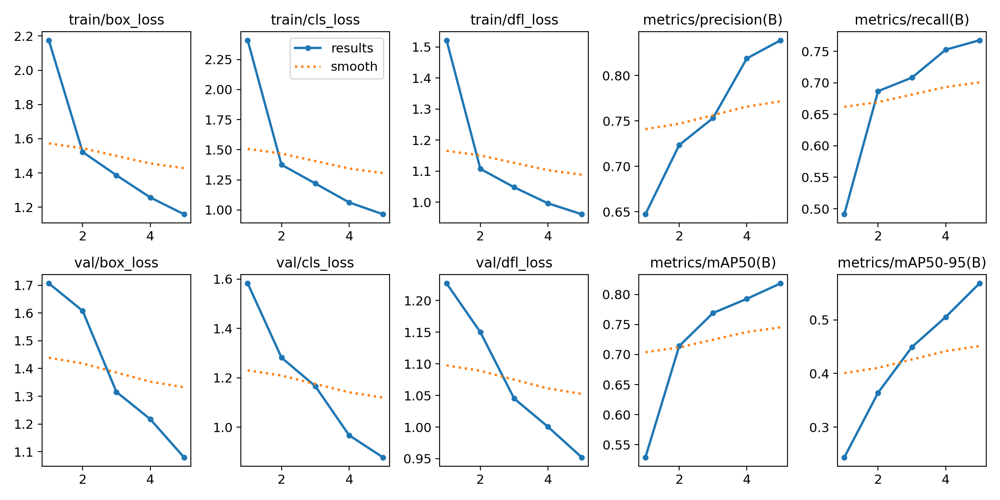

In [22]:
from IPython.display import display, Image
Image(filename='/content/runs/detect/train9/results.png', width=600)

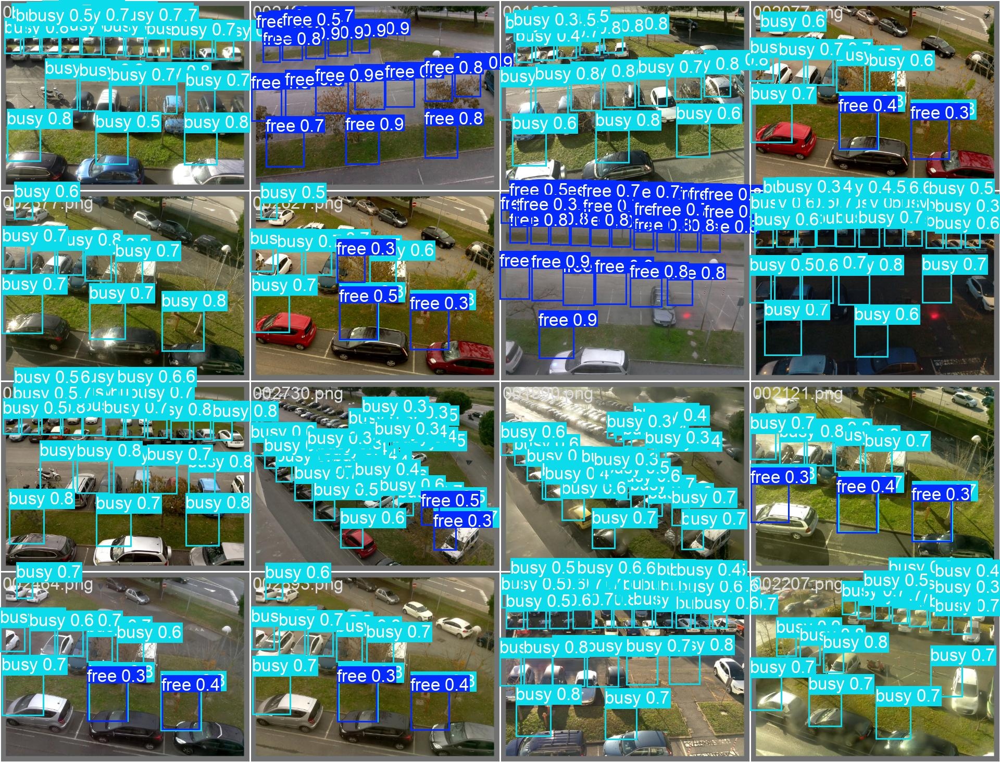

In [26]:
Image(filename=f'/content/runs/detect/train9/val_batch0_pred.jpg', width=2000)

Testing Model

In [27]:
test_images_dir = "/content/drive/MyDrive/Mobile Robotics Project/data/Carla_images"


image 1/6 /content/drive/MyDrive/Mobile Robotics Project/data/Carla_images/Screenshot 2025-02-18 at 12.42.58 PM.png: 480x640 4 frees, 9.5ms
image 2/6 /content/drive/MyDrive/Mobile Robotics Project/data/Carla_images/Screenshot 2025-02-18 at 12.43.08 PM.png: 480x640 1 free, 9.3ms
image 3/6 /content/drive/MyDrive/Mobile Robotics Project/data/Carla_images/Screenshot 2025-02-18 at 12.43.18 PM.png: 480x640 1 busy, 8.9ms
image 4/6 /content/drive/MyDrive/Mobile Robotics Project/data/Carla_images/Screenshot 2025-02-18 at 12.43.25 PM.png: 480x640 (no detections), 9.1ms
image 5/6 /content/drive/MyDrive/Mobile Robotics Project/data/Carla_images/Screenshot 2025-02-18 at 12.43.34 PM.png: 480x640 1 free, 1 busy, 8.8ms
image 6/6 /content/drive/MyDrive/Mobile Robotics Project/data/Carla_images/Screenshot 2025-02-18 at 12.43.39 PM.png: 480x640 (no detections), 8.7ms
Speed: 2.7ms preprocess, 9.1ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


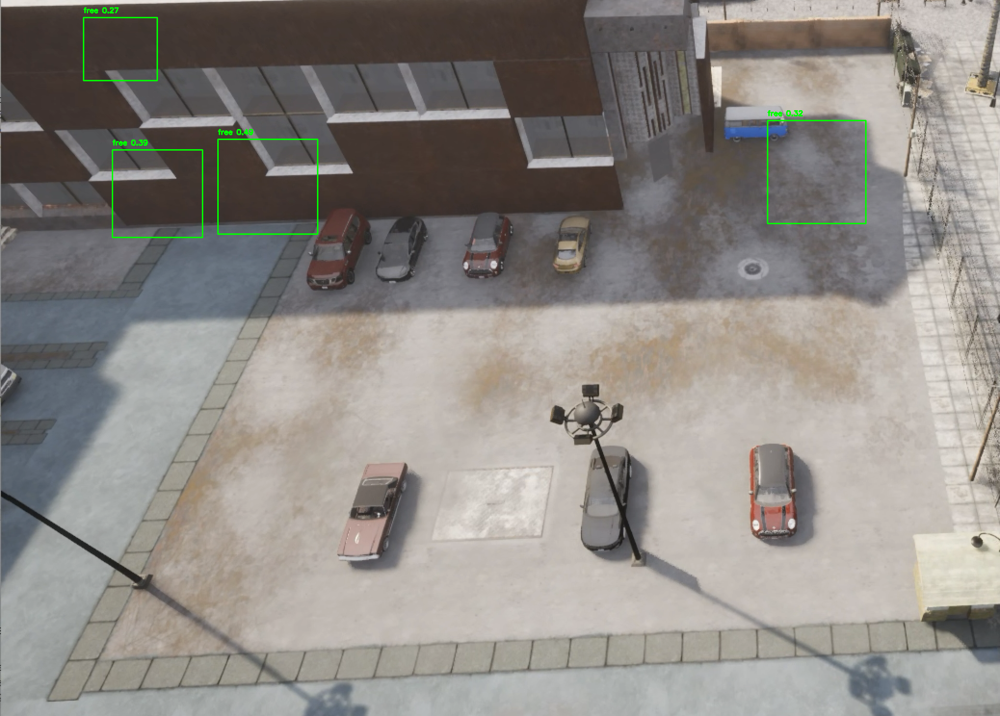

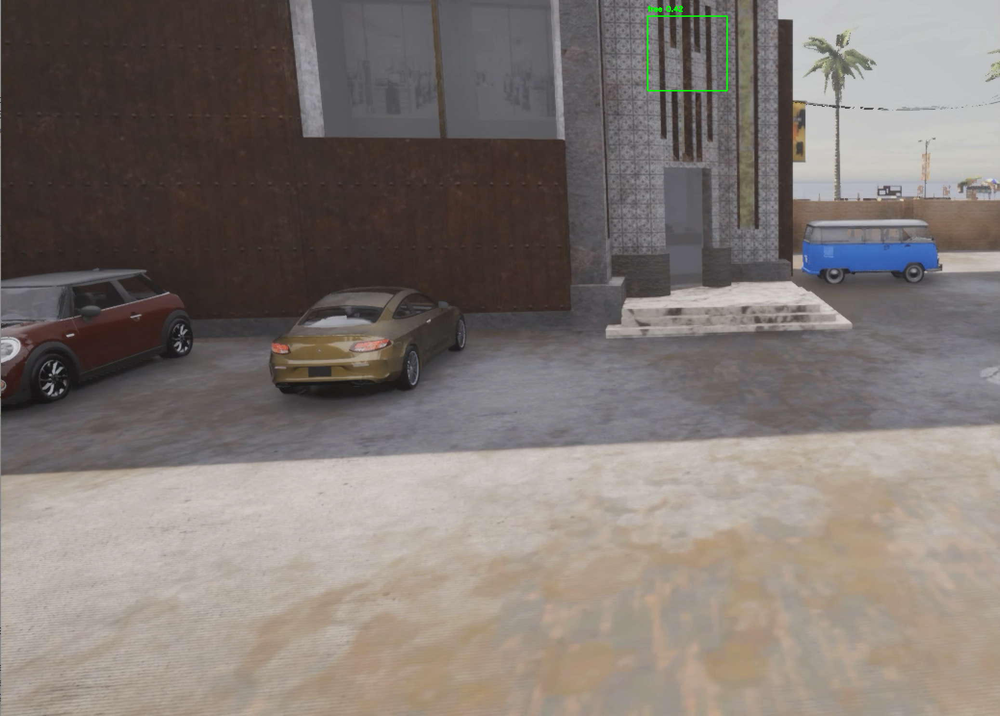

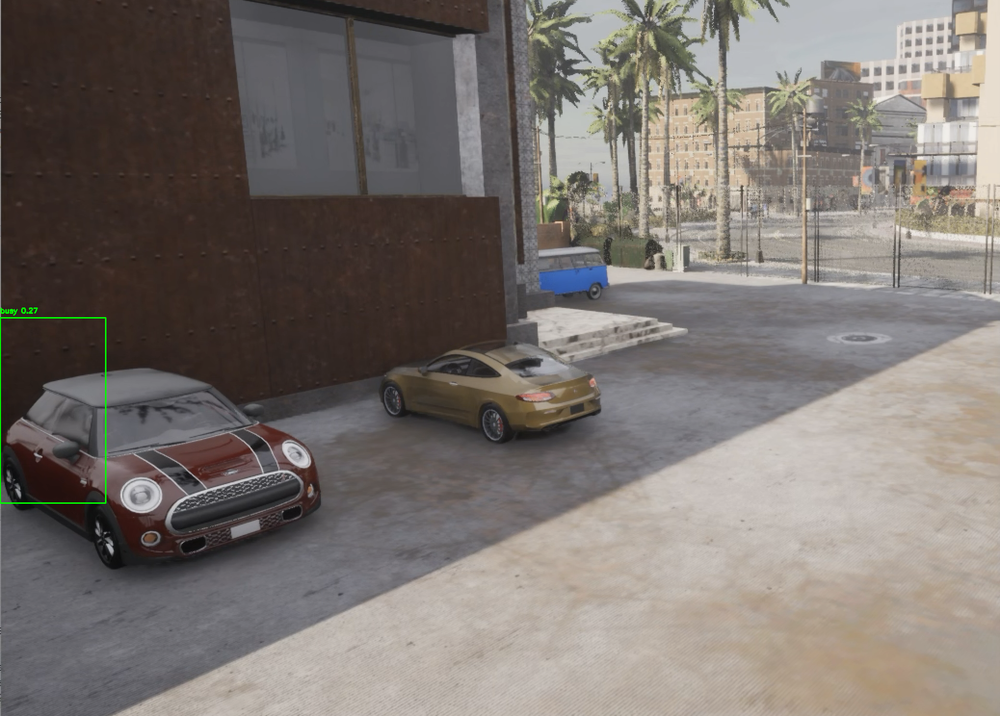

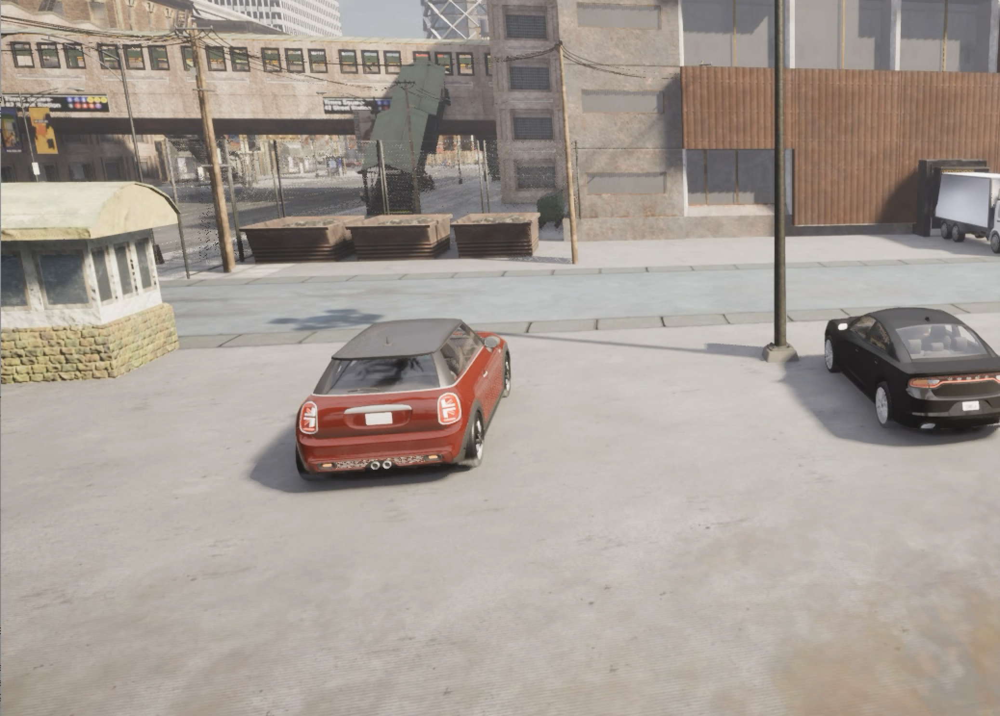

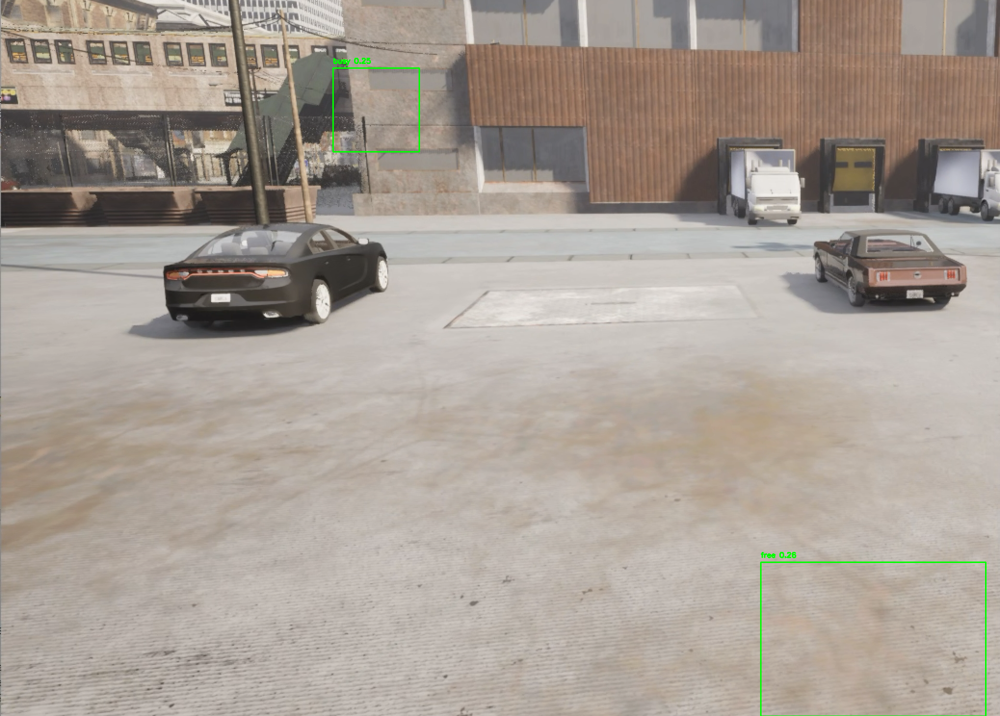

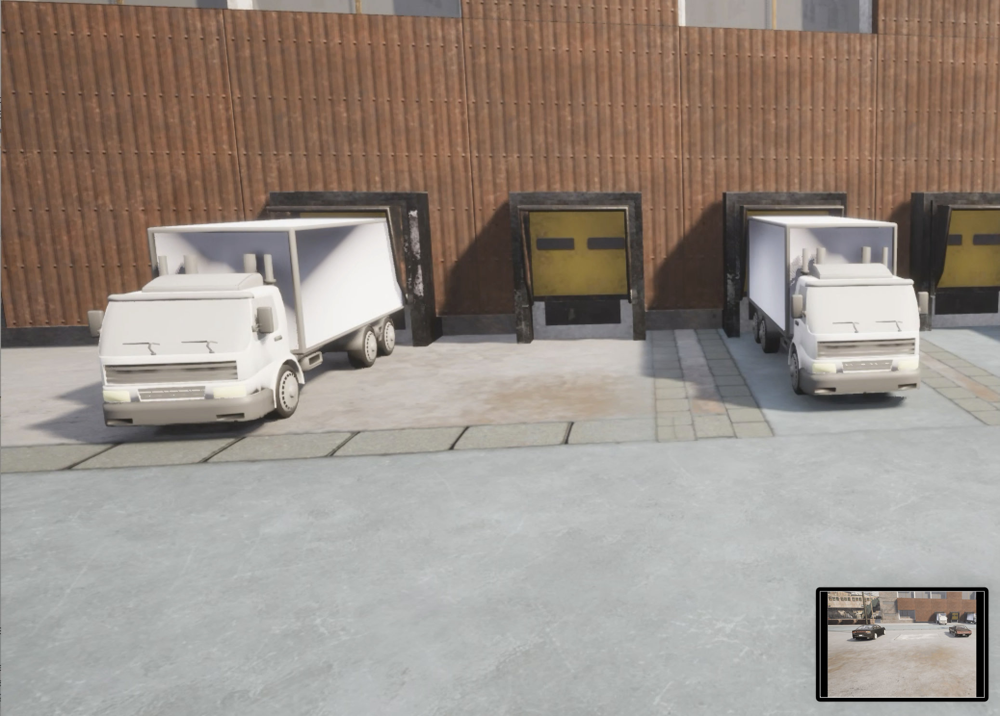

In [29]:
from google.colab.patches import cv2_imshow
import cv2
import torch

# Run inference on test images
results = yolo(test_images_dir)

# Loop through results and draw bounding boxes
for i, r in enumerate(results):
    img = r.orig_img.copy()  # Get original image
    boxes = r.boxes.xyxy.cpu().numpy()  # Bounding box coordinates (x1, y1, x2, y2)
    class_ids = r.boxes.cls.cpu().numpy().astype(int)  # Class IDs
    confidences = r.boxes.conf.cpu().numpy()  # Confidence scores

    for box, cls_id, conf in zip(boxes, class_ids, confidences):
        x1, y1, x2, y2 = map(int, box)
        label = f"{yolo.names[cls_id]} {conf:.2f}"  # Label with class name and confidence

        # Draw bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display image in Colab
    cv2_imshow(img)
    cv2.waitKey(0)  # Wait for key press to show next image
    cv2.destroyAllWindows()  # Close window before showing the next image

